In [44]:
import numpy as np
from scipy.spatial import distance_matrix
import matplotlib.pyplot as plt
from Functions import *
from gaussfft import gaussfft
from PIL import Image
from lab3 import kmeans_segm
from kmeans_example import *
from mean_shift_example import mean_shift_segm,mean_shift_example
from norm_cuts_example import *
from graphcut_example import *

In [45]:
def open_image(path):
    im = Image.open(path)
    im = np.array(im).astype(np.float32)
    return im

In [46]:
ima = open_image('Images-jpg/orange.jpg')
print(ima.shape)

(551, 572, 3)


## Exercise 2 : K-means clustering

In [47]:
def image_from_segmentation(segmentation, centers):
    """
    Creates an image from a segmentation and cluster centers.
    """ 
    # get image dimensions
    height, width = segmentation.shape

    # create image from segmentation and centers
    image = np.zeros((height, width, 3))
    for i in range(height):
        for j in range(width):
            image[i, j] = centers[segmentation[i, j]]

    return image

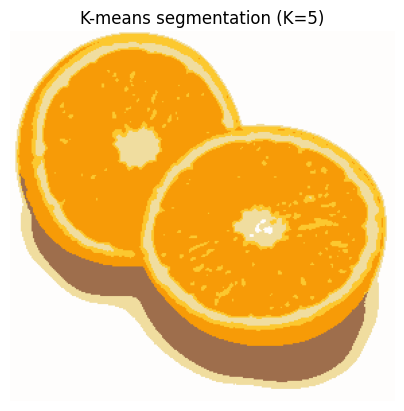

Number of iterations before convergence:  24


In [48]:
scale_factor = 0.5
image_sigma = 1.0
img = Image.open('Images-jpg/orange.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
h = ImageFilter.GaussianBlur(image_sigma)
I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)


segmentation, centers,num_iterations = kmeans_segm(image=I, K = 5, L=50,early_stopping=True) 
result = image_from_segmentation(segmentation, centers)
result_bytes = np.uint8(result)
plt.imshow(result_bytes)
plt.axis('off')
plt.title('K-means segmentation (K=5)')
plt.show()
print('Number of iterations before convergence: ', num_iterations)


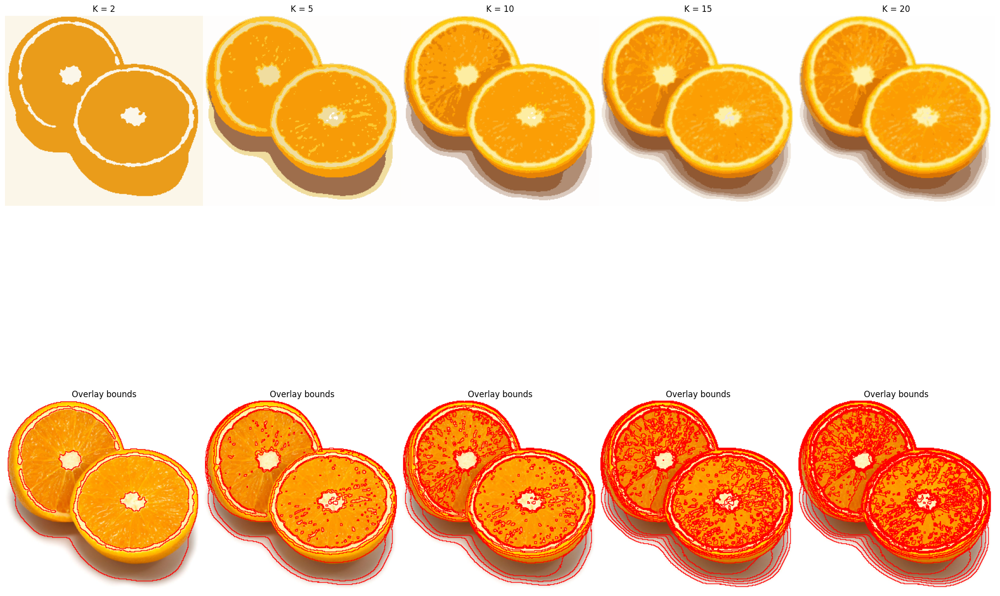

Text(0.5, 1.0, 'Number of iterations before convergence for different values of K')

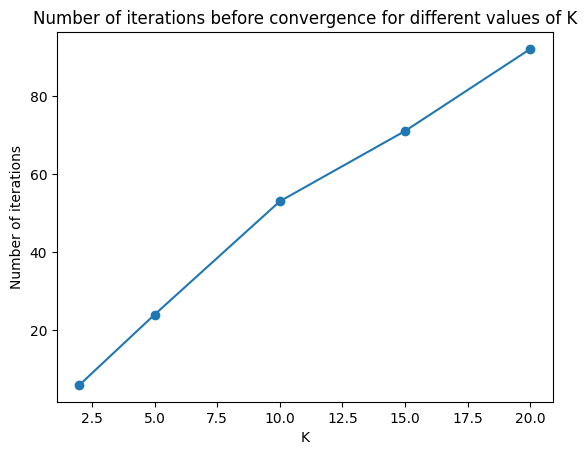

In [35]:
# Testing different values of K
scale_factor = 0.5
image_sigma=1.0
K_s = [2, 5, 10, 15, 20]
convergence_times =[]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i, K in enumerate(K_s):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers, conv_time = kmeans_segm(image=img, K = K, L=100, early_stopping=True)
    convergence_times.append(conv_time)
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'K = {K}')
    img= Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout(pad=0)
plt.show()

plt.plot(K_s, convergence_times, 'o-')
plt.xlabel('K')
plt.ylabel('Number of iterations')
plt.title('Number of iterations before convergence for different values of K')


In [36]:
convergence_times

[6, 24, 53, 71, 92]

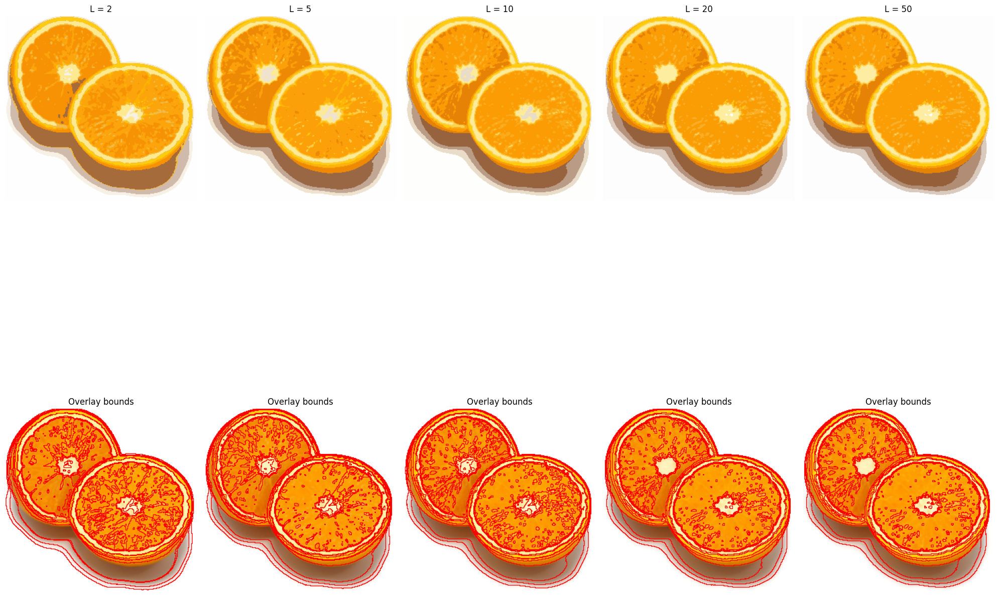

In [ ]:
# Testing different values of L
scale_factor = 0.5
image_sigma=1.0
L_s = [2, 5, 10, 20, 50]
fig, axs = plt.subplots(2, len(L_s), figsize=(20, 20))
for i, l in enumerate(L_s):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 10, L=l) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'L = {l}')
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

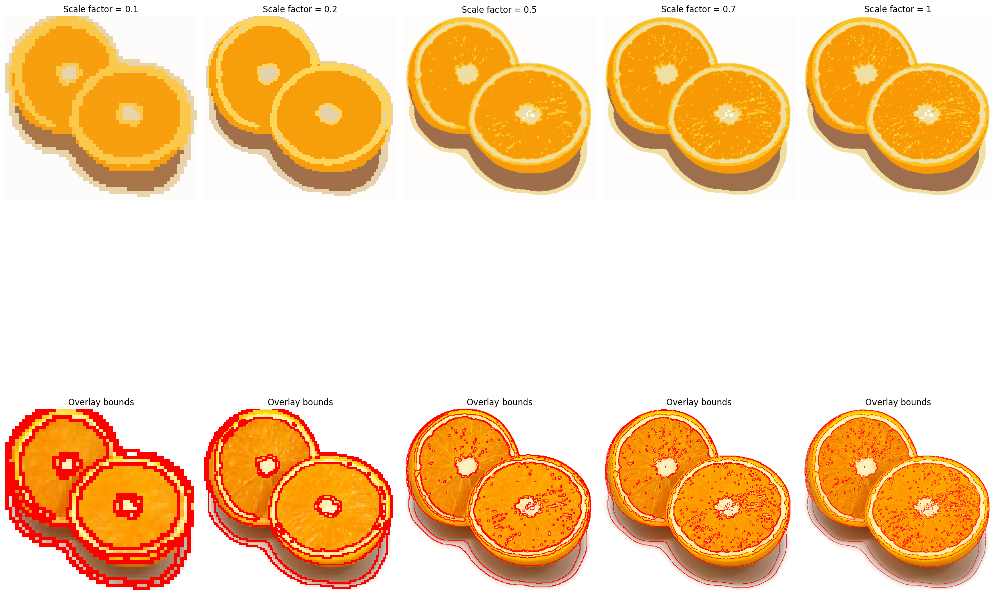

In [ ]:
# Testing different values of scale factor
image_sigma=1.0
scale_factors = [0.1,0.2, 0.5, 0.7, 1]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
for i, scale_factor in enumerate(scale_factors):
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    if image_sigma > 0:
        img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 5, L=30) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Scale factor = {scale_factor}')
    img= Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

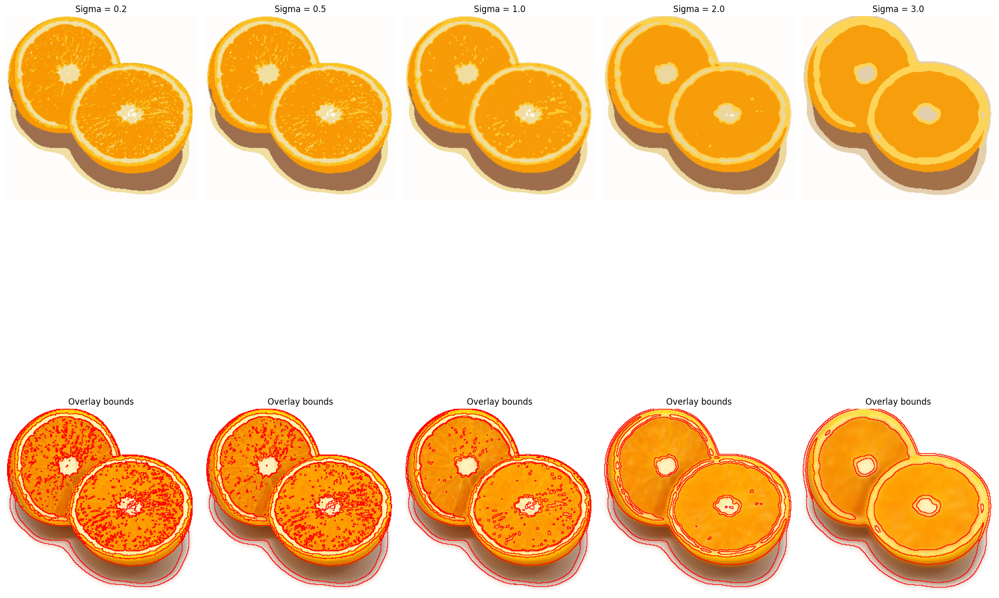

In [ ]:
# Testing different values of sigma
scale_factor = 0.5
sigma_s = [0.2,0.5, 1.0, 2.0, 3.0]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
for i, sigma in enumerate(sigma_s):
    
    img = Image.open('Images-jpg/orange.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img.filter(ImageFilter.GaussianBlur(sigma))).astype(np.float32)
    segmentation, centers,_ = kmeans_segm(image=img, K = 5, L=30) 
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Sigma = {sigma}')
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout()
plt.show()

### Question 3

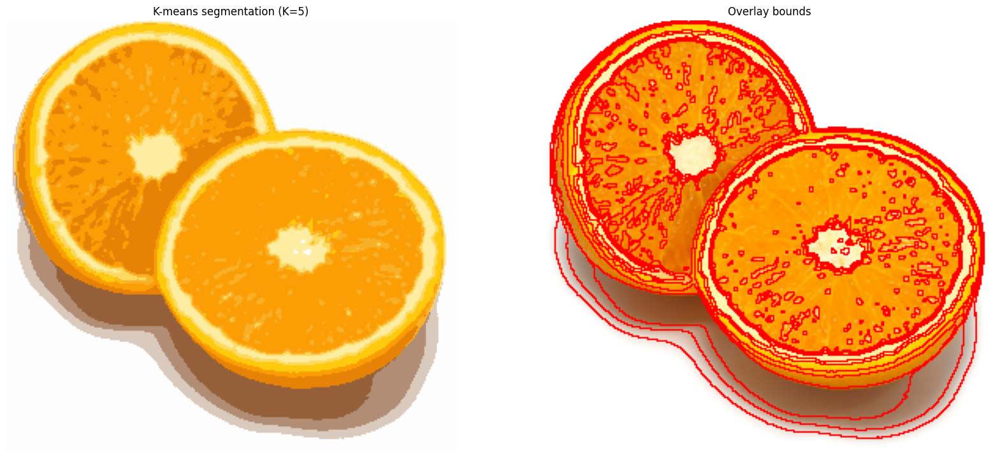

In [43]:
fig,axs=plt.subplots(1,2,figsize=(20,20))
scale_factor = 0.5
image_sigma = 1.0
img = Image.open('Images-jpg/orange.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
h = ImageFilter.GaussianBlur(image_sigma)
I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)


segmentation, centers,num_iterations = kmeans_segm(image=I, K = 10, L=50,early_stopping=True) 
result = image_from_segmentation(segmentation, centers)
result_bytes = np.uint8(result)
Inew = mean_segments(img, segmentation)
Inew = overlay_bounds(img, segmentation)
image = Image.fromarray(Inew.astype(np.ubyte))
axs[1].imshow(image)
axs[1].axis('off')
axs[1].set_title('Overlay bounds')

axs[0].imshow(result_bytes)
axs[0].axis('off')
axs[0].set_title('K-means segmentation (K=5)')
plt.show()


### Question 4

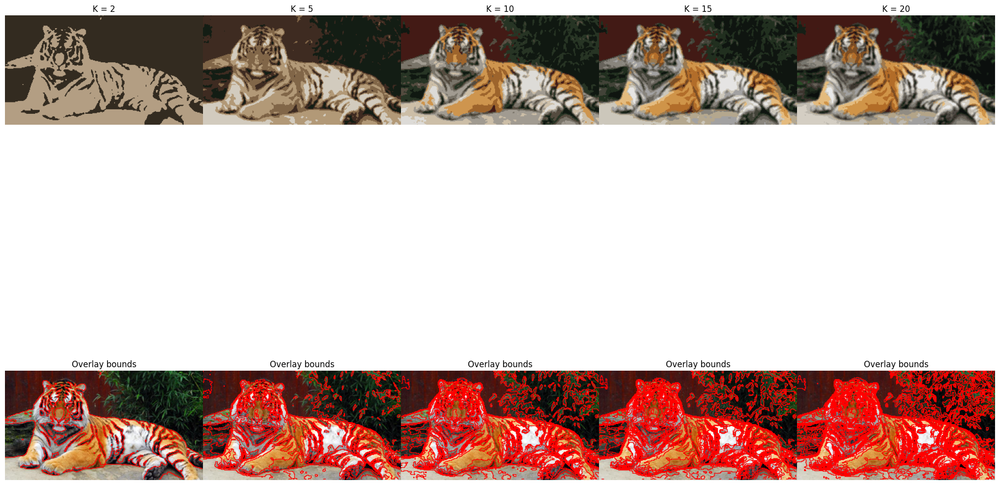

Text(0.5, 1.0, 'Number of iterations before convergence for different values of K')

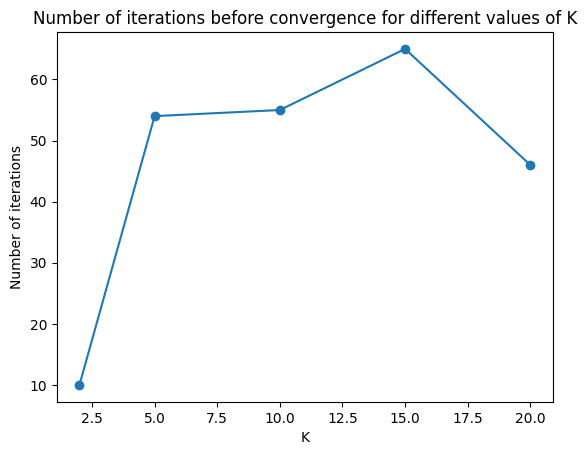

In [37]:
scale_factor = 0.5
image_sigma=1.0
K_s = [2, 5, 10, 15, 20]
convergence_times =[]
fig, axs = plt.subplots(2, len(K_s), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i, K in enumerate(K_s):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation, centers, conv_time = kmeans_segm(image=img, K = K, L=100, early_stopping=True)
    convergence_times.append(conv_time)
    result = image_from_segmentation(segmentation, centers)
    result_bytes = np.uint8(result)
    axs[0,i].imshow(result_bytes)
    axs[0,i].axis('off')
    axs[0,i].set_title(f'K = {K}')
    img= Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    img = np.asarray(img).astype(np.float32)
    Inew = mean_segments(img, segmentation)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    axs[1,i].imshow(image)
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
fig.tight_layout(pad=0)
plt.show()

plt.plot(K_s, convergence_times, 'o-')
plt.xlabel('K')
plt.ylabel('Number of iterations')
plt.title('Number of iterations before convergence for different values of K')

In [38]:
convergence_times

[10, 54, 55, 65, 46]

## Exercise 3 : Mean-shift segmentation

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


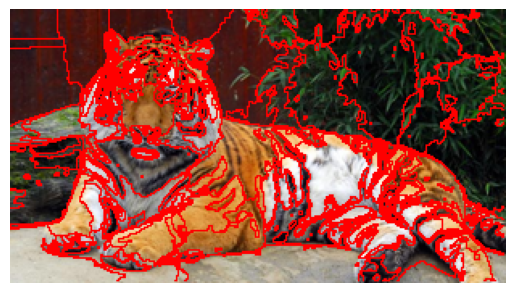

In [ ]:
mean_shift_example()

### Question 5

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


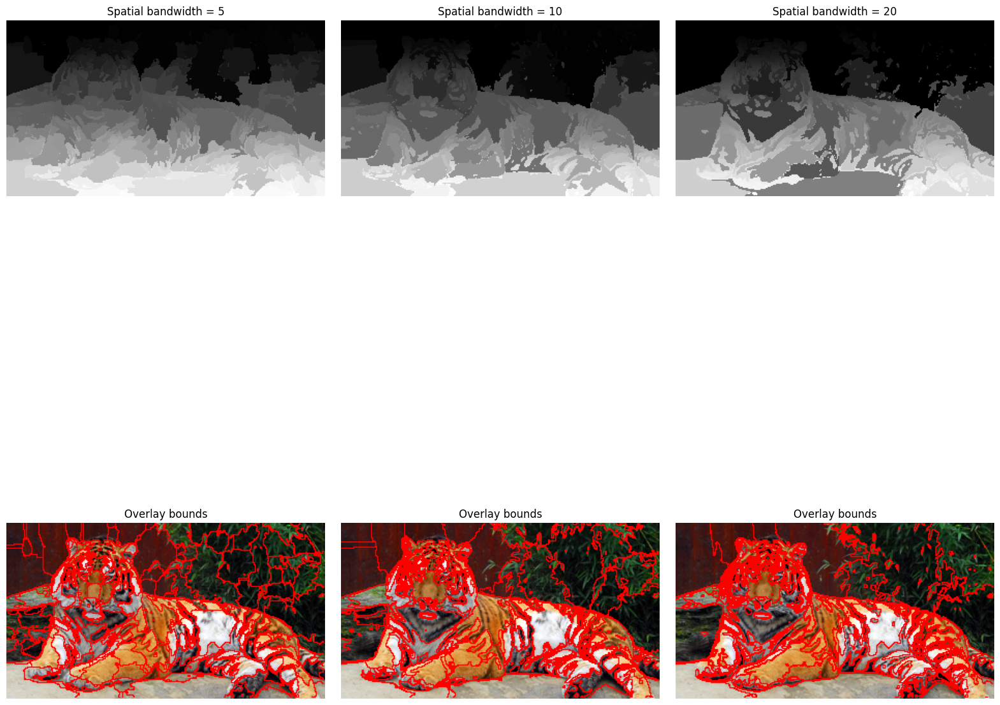

In [32]:
spatial_bandwidths = [5, 10, 20]
num_iterations = 40
scale_factor = 0.5         # image downscale factor
image_sigma = 1.0          # image preblurring scale
colour_bandwidth = 20.0    # colour bandwidth
num_iterations = 40        # number of mean-shift iterations

fig, axs = plt.subplots(2, len(spatial_bandwidths), figsize=(20, 20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i,spatial_bw in enumerate(spatial_bandwidths):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segm = mean_shift_segm(I, spatial_bw, colour_bandwidth, num_iterations)
    axs[0,i].imshow(segm, cmap='gray')
    axs[0,i].axis('off')
    axs[0,i].set_title(f'Spatial bandwidth = {spatial_bw}')
    axs[0,i].set_aspect('equal')
    axs[1,i].imshow(overlay_bounds(img, segm))
    axs[1,i].axis('off')
    axs[1,i].set_aspect('equal')
    axs[1,i].set_title('Overlay bounds')
plt.show()

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...
Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


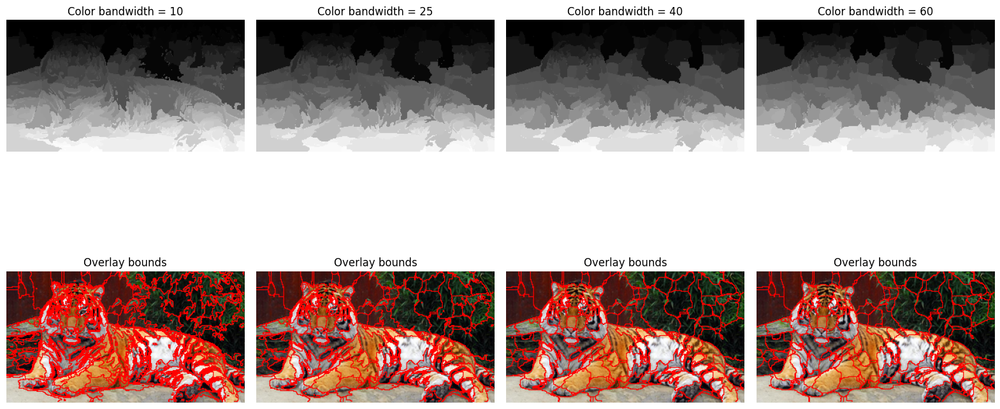

In [24]:
color_bandwidths = [10, 25, 40, 60]
spatial_bandwidth = 5
num_iterations = 40
scale_factor = 0.5         # image downscale factor
image_sigma = 1.0          # image preblurring scale
num_iterations = 40        # number of mean-shift iterations

fig, axs = plt.subplots(2, len(color_bandwidths), figsize=(20, 10))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.05, hspace=.05)

for i,color_bw in enumerate(color_bandwidths):
    img = Image.open('Images-jpg/tiger1.jpg')
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segm = mean_shift_segm(I, spatial_bandwidth, color_bw, num_iterations)
    axs[0,i].imshow(segm, cmap='gray')
    axs[0,i].axis('off')
    axs[0,i].set_aspect('equal')
    axs[0,i].set_title(f'Color bandwidth = {color_bw}')
    axs[1,i].imshow(overlay_bounds(img, segm))
    axs[1,i].axis('off')
    axs[1,i].set_title('Overlay bounds')
plt.show()

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


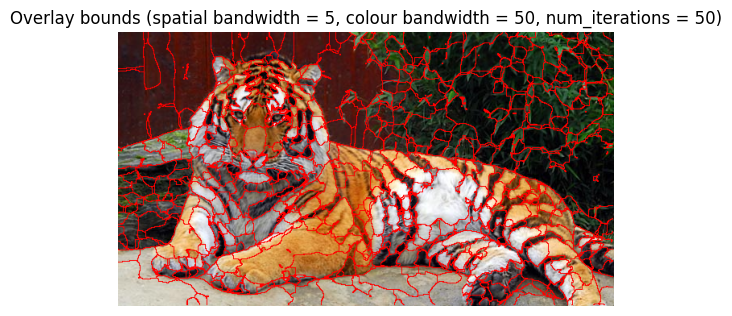

In [31]:
image_sigma=1.0
spatial_bw = 5
color_bw = 50
num_iterations = 50
img = Image.open('Images-jpg/tiger1.jpg')
I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
segm = mean_shift_segm(I=I, spatial_bandwidth=spatial_bw, colour_bandwidth=color_bw, num_iterations=num_iterations)
plt.imshow(overlay_bounds(img, segm))
plt.axis('off')
plt.title('Overlay bounds (spatial bandwidth = {}, colour bandwidth = {}, num_iterations = {})'.format(spatial_bw, color_bw, num_iterations))
plt.show()

### Question 6

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


Text(0.5, 1.0, 'K-Means')

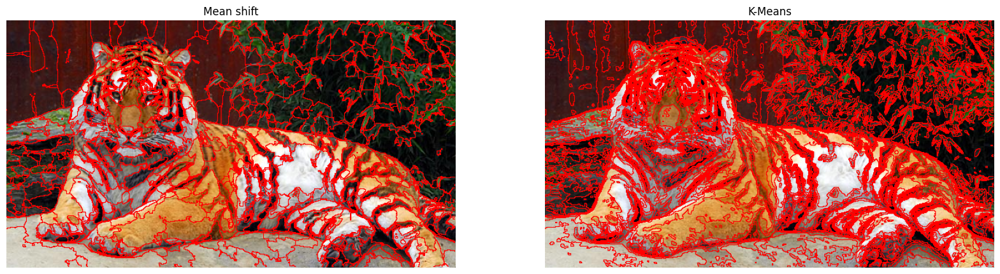

In [ ]:
image_sigma = 1.0
spatial_bandwidth = 5
color_bw = 20
num_iterations = 40
K=15

fig,axs = plt.subplots(1,2, figsize=(20, 10))
original_img = Image.open('Images-jpg/tiger1.jpg')
I = np.asarray(original_img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
segm_mean_shift = mean_shift_segm(I, spatial_bandwidth, color_bw, num_iterations)
axs[0].imshow(overlay_bounds(original_img, segm_mean_shift))
axs[0].axis('off')
axs[0].set_title('Mean shift')

segm_kmeans,_,_ = kmeans_segm(I, K=K, L=num_iterations)
Inew = mean_segments(original_img, segm_kmeans)
Inew = overlay_bounds(original_img, segm_kmeans)
image = Image.fromarray(Inew.astype(np.ubyte))
axs[1].imshow(image)
axs[1].axis('off')
axs[1].set_title('K-Means')

## Exercise 4 : Normalized cut

Compute affinity matrix...
Solve eigenvalue problems to find partitions...


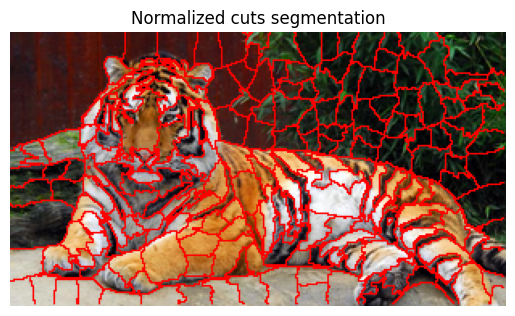

In [17]:
colour_bandwidth = 20.0  # color bandwidth
radius = 3              # maximum neighbourhood distance
ncuts_thresh = 0.1      # cutting threshold
min_area = 100           # minimum area of segment
max_depth = 15           # maximum splitting depth
scale_factor = 0.5      # image downscale factor
image_sigma = 0.5        # image preblurring scale

image = Image.open('Images-jpg/tiger1.jpg')
image = image.resize((int(image.size[0]*scale_factor), int(image.size[1]*scale_factor)))

    
h = ImageFilter.GaussianBlur(image_sigma)
I = np.asarray(image.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

segmentation = norm_cuts_segm(I, colour_bandwidth, radius, ncuts_thresh, min_area, max_depth)

Inew = mean_segments(image, segmentation)
Inew = overlay_bounds(image, segmentation)

image = Image.fromarray(Inew.astype(np.ubyte))
plt.imshow(image)
plt.axis('off')
plt.title('Normalized cuts segmentation')
plt.show()

### Question 7

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


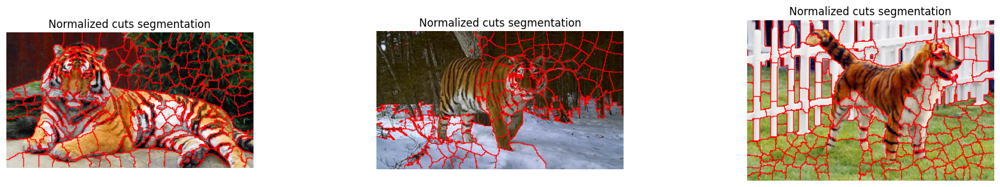

In [49]:
colour_bandwidth = 20.0  # color bandwidth
radius = 3              # maximum neighbourhood distance
ncuts_thresh = 0.1      # cutting threshold
min_area = 100           # minimum area of segment
max_depth = 15           # maximum splitting depth
scale_factor = 0.5      # image downscale factor
image_sigma = 0.5        # image preblurring scale

img_paths = ['Images-jpg/tiger1.jpg', 'Images-jpg/tiger2.jpg', 'Images-jpg/tiger3.jpg']

f, ax = plt.subplots(1, 3, figsize=(20, 10))
f.subplots_adjust(hspace=0.5, wspace=0.5)
ax = ax.flatten()

for i,img_path in enumerate(img_paths):
    image = Image.open(img_path)
    image = image.resize((int(image.size[0]*scale_factor), int(image.size[1]*scale_factor)))
    I = np.asarray(image.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)
    segmentation = norm_cuts_segm(I, colour_bandwidth, radius, ncuts_thresh, min_area, max_depth)
    Inew = mean_segments(image, segmentation)
    Inew = overlay_bounds(image, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    ax[i].imshow(image)
    ax[i].axis('off')
    ax[i].set_title('Normalized cuts segmentation')
plt.show()



Compute affinity matrix...
Solve eigenvalue problems to find partitions...


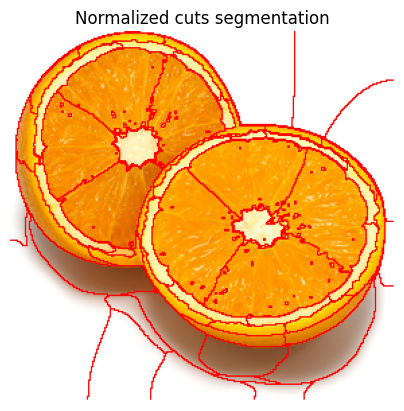

In [51]:
colour_bandwidth = 20.0 
radius = 10             
ncuts_thresh = 0.1      
min_area = 100          
max_depth = 10          
scale_factor = 0.5      
image_sigma = 0.5       

image = Image.open('Images-jpg/orange.jpg')
image = image.resize((int(image.size[0]*scale_factor), int(image.size[1]*scale_factor)))

    
h = ImageFilter.GaussianBlur(image_sigma)
I = np.asarray(image.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

segmentation = norm_cuts_segm(I, colour_bandwidth, radius, ncuts_thresh, min_area, max_depth)

Inew = mean_segments(image, segmentation)
Inew = overlay_bounds(image, segmentation)

image = Image.fromarray(Inew.astype(np.ubyte))
plt.imshow(image)
plt.axis('off')
plt.title('Normalized cuts segmentation')
plt.show()

### Question 8

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


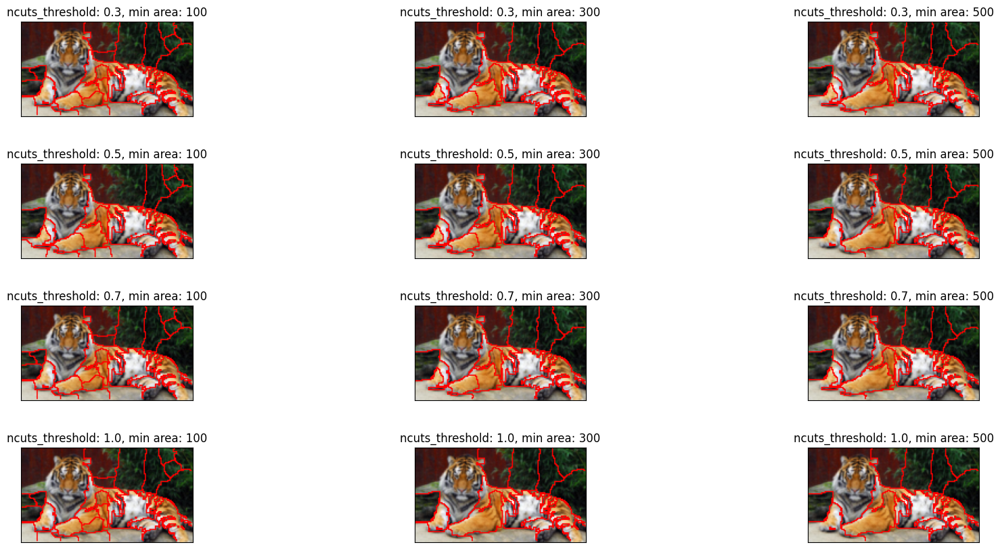

In [18]:
# Effect of ncuts threshold and min area
img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*0.25), int(img.size[1]*0.25)))
image_sigma = 0.5
img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

color_bandwidth = 20
radius = 1
min_area = [100, 300, 500]
ncuts_thresh = [0.3, 0.5, 0.7,1.0]
max_depth = 12
f, ax = plt.subplots(len(ncuts_thresh), len(min_area), figsize=(20, 10))
f.subplots_adjust(hspace=0.5, wspace=0.5)
for i, t in enumerate(ncuts_thresh):
    for j, ma in enumerate(min_area):
        segmentation = norm_cuts_segm(img, color_bandwidth, radius, t, ma, max_depth)
        Inew = overlay_bounds(img, segmentation)
        image = Image.fromarray(Inew.astype(np.ubyte))
        ax[i,j].imshow(image)
        ax[i,j].set_title(f"ncuts_threshold: {t}, min area: {ma}")
        ax[i][j].set_aspect('equal')
        ax[i][j].set_xticklabels([])
        ax[i][j].set_yticklabels([])
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
plt.show()

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


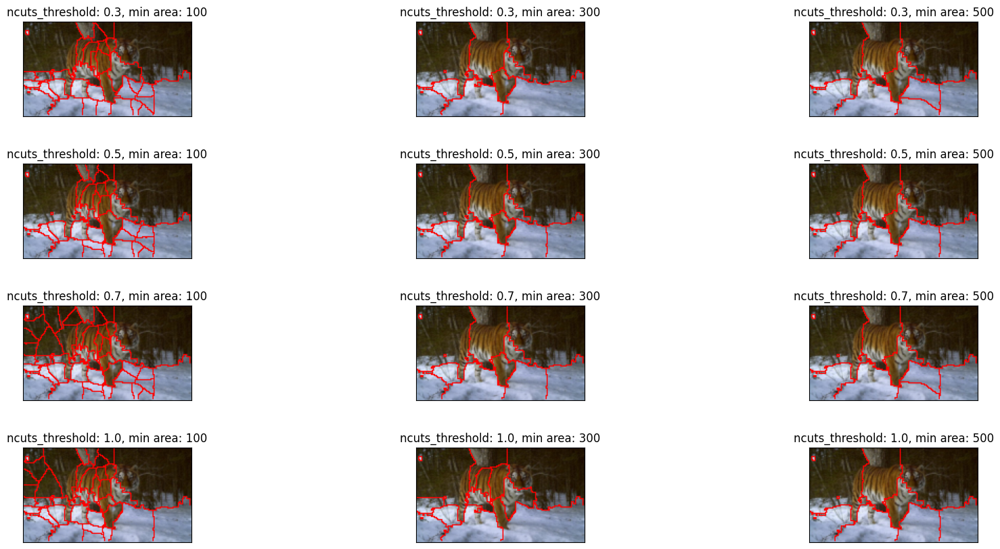

In [33]:
# Effect of ncuts threshold and min area
img = Image.open('Images-jpg/tiger2.jpg')
img = img.resize((int(img.size[0]*0.25), int(img.size[1]*0.25)))
image_sigma = 0.5
img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

color_bandwidth = 20
radius = 1
min_area = [100, 300, 500]
ncuts_thresh = [0.3, 0.5, 0.7,1.0]
max_depth = 12
f, ax = plt.subplots(len(ncuts_thresh), len(min_area), figsize=(20, 10))
f.subplots_adjust(hspace=0.5, wspace=0.5)
for i, t in enumerate(ncuts_thresh):
    for j, ma in enumerate(min_area):
        segmentation = norm_cuts_segm(img, color_bandwidth, radius, t, ma, max_depth)
        Inew = overlay_bounds(img, segmentation)
        image = Image.fromarray(Inew.astype(np.ubyte))
        ax[i,j].imshow(image)
        ax[i,j].set_title(f"ncuts_threshold: {t}, min area: {ma}")
        ax[i][j].set_aspect('equal')
        ax[i][j].set_xticklabels([])
        ax[i][j].set_yticklabels([])
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
plt.show()

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


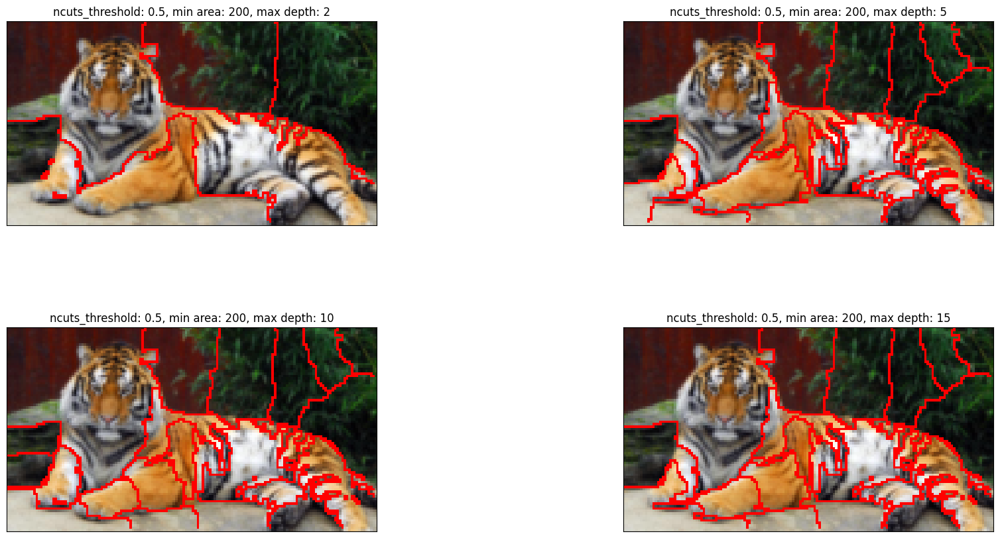

In [57]:
# Effect of max depth
img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*0.25), int(img.size[1]*0.25)))
image_sigma = 0.5
img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

color_bandwidth = 20
radius = 1
min_area = 200
ncuts_thresh = 0.5
max_depth = [2,5, 10, 15]
f, ax = plt.subplots(2, 2, figsize=(20, 10))
ax = ax.flatten()
f.subplots_adjust(hspace=0.5, wspace=0.5)
for i, md in enumerate(max_depth):
    segmentation = norm_cuts_segm(img, color_bandwidth, radius, ncuts_thresh, min_area, md)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    ax[i].imshow(image)
    ax[i].set_title(f"ncuts_threshold: {ncuts_thresh}, min area: {min_area}, max depth: {md}")
    ax[i].set_aspect('equal')
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.show()

Compute affinity matrix...
Solve eigenvalue problems to find partitions...


Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


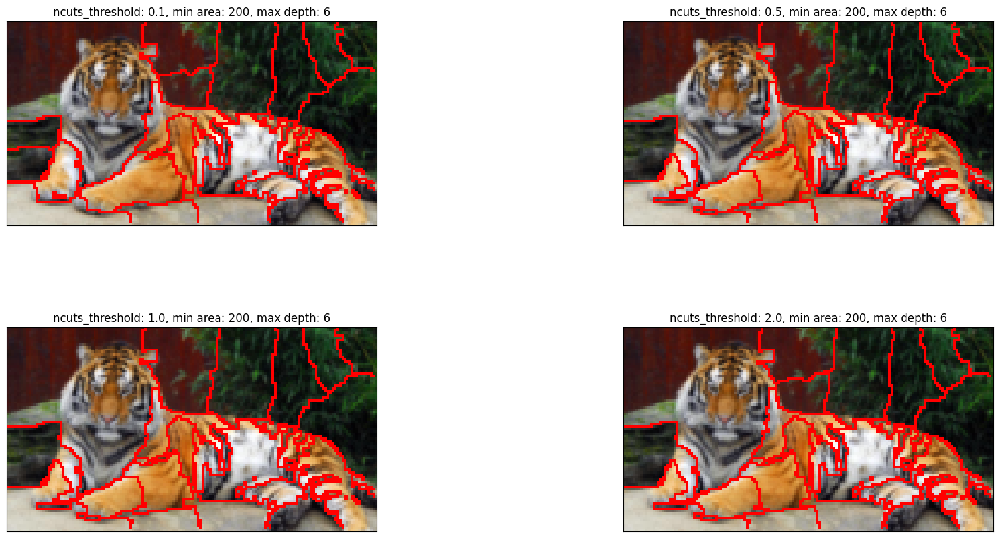

In [56]:
#Effect of different values of ncuts threshold
img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*0.25), int(img.size[1]*0.25)))
image_sigma = 0.5
img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

color_bandwidth = 20
radius = 1
min_area = 200
ncuts_threshs = [0.1, 0.5,1.0,2.0] 
max_depth = 6
f, ax = plt.subplots(2, 2, figsize=(20, 10))
ax = ax.flatten()
f.subplots_adjust(hspace=0.5, wspace=0.5)
for i, ncuts_thresh in enumerate(ncuts_threshs):
    segmentation = norm_cuts_segm(img, color_bandwidth, radius, ncuts_thresh, min_area, max_depth)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    ax[i].imshow(image)
    ax[i].set_title(f"ncuts_threshold: {ncuts_thresh}, min area: {min_area}, max depth: { max_depth}")
    ax[i].set_aspect('equal')
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.show()

### Question 10

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Compute affinity matrix...
Solve eigenvalue problems to find partitions...


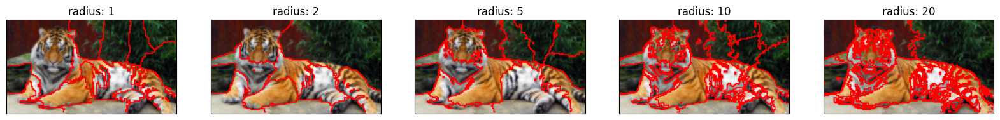

In [ ]:
img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*0.25), int(img.size[1]*0.25)))
image_sigma = 0.5
img = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

r_s = [1,2, 5, 10, 20]
ncuts_thresh=0.7
min_area = 500
color_bandwidth = 20
max_depth = 12

f, ax = plt.subplots(1, len(r_s), figsize=(20, 10))

for i,r in enumerate(r_s):
    segmentation = norm_cuts_segm(img, color_bandwidth, r, ncuts_thresh, min_area, max_depth)
    Inew = overlay_bounds(img, segmentation)
    image = Image.fromarray(Inew.astype(np.ubyte))
    ax[i].imshow(image)
    ax[i].set_title(f"radius: {r}")
    ax[i].set_aspect('equal')
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.show()

## Exercise 5 : Segmentation using graph cuts 

Find Gaussian mixture models...


Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100


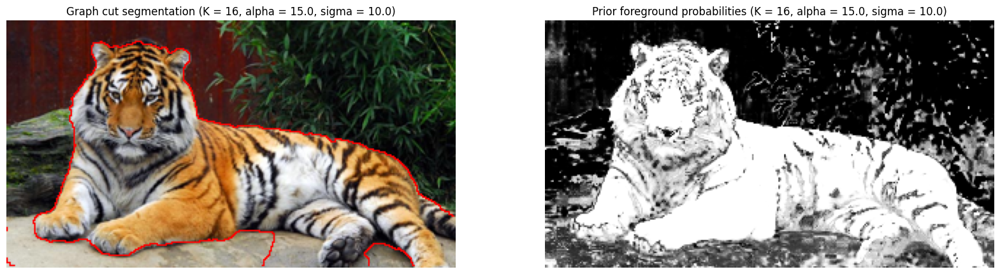

In [11]:
scale_factor = 0.5           # image downscale factor
area = [ 80, 110, 570, 300 ] # image region to train foreground with [ minx, miny, maxx, maxy ]
K = 16                       # number of mixture components
alpha = 15.0                  # maximum edge cost
sigma = 10.0                 # edge cost decay factor

img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))

area = [ int(i*scale_factor) for i in area ]
I = np.asarray(img).astype(np.float32)
segm, prior = graphcut_segm(I, area, K, alpha, sigma)

Inew = mean_segments(img, segm)
Inew = overlay_bounds(img, segm)
img = Image.fromarray(Inew.astype(np.ubyte))

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(img)
axs[0].axis('off')
axs[0].set_title('Graph cut segmentation (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
axs[1].imshow(prior, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Prior foreground probabilities (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
plt.show()

Find Gaussian mixture models...
Find minimum cut...
number of iterations = 88
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 65
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 54
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 76
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 95
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 73
Find Gaussian mixture models...
Find minimum cut...
number

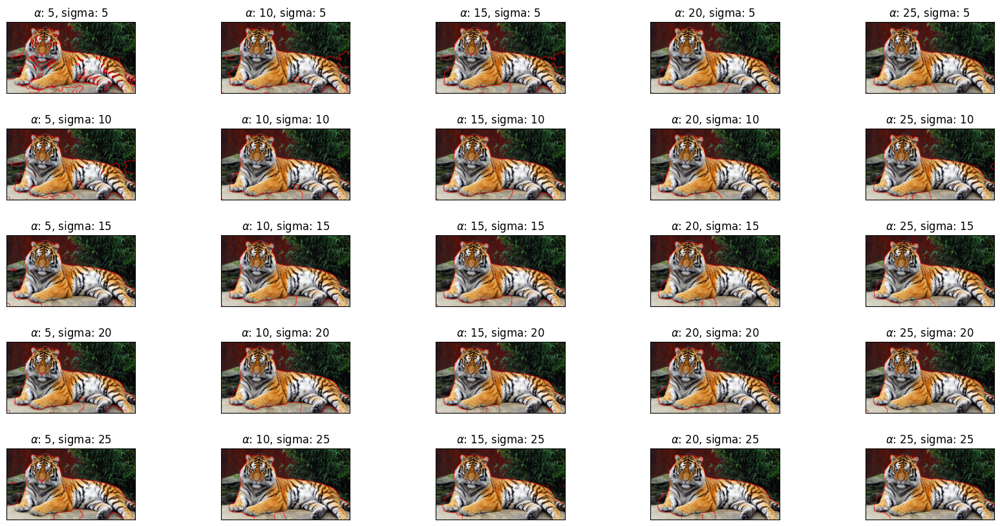

In [7]:
alphas = [5, 10, 20]
sigmas = [5, 10, 20]
scale_factor = 0.5           # image downscale factor
area = [ 80, 110, 570, 300 ] # image region to train foreground with [ minx, miny, maxx, maxy ]
K = 16                       # number of mixture components

img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
area = [ int(i*scale_factor) for i in area ]
I = np.asarray(img).astype(np.float32)

f, ax = plt.subplots(len(alphas), len(sigmas), figsize=(20, 10))
f.subplots_adjust(hspace=0.5, wspace=0.5)
for j, alpha in enumerate(alphas):
    for i, sigma in enumerate(sigmas):
        segm, prior = graphcut_segm(I, area, K, alpha, sigma)
        Inew = mean_segments(img, segm)
        Inew = overlay_bounds(img, segm)
        img_to_plot = Image.fromarray(Inew.astype(np.ubyte))
        ax[i,j].imshow(img_to_plot)
        ax[i,j].set_title(f"$\\alpha$: {alpha}, sigma: {sigma}")
        ax[i][j].set_aspect('equal')
        ax[i][j].set_xticklabels([])
        ax[i][j].set_yticklabels([])
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
plt.show()


### Question 11

Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 94
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 88


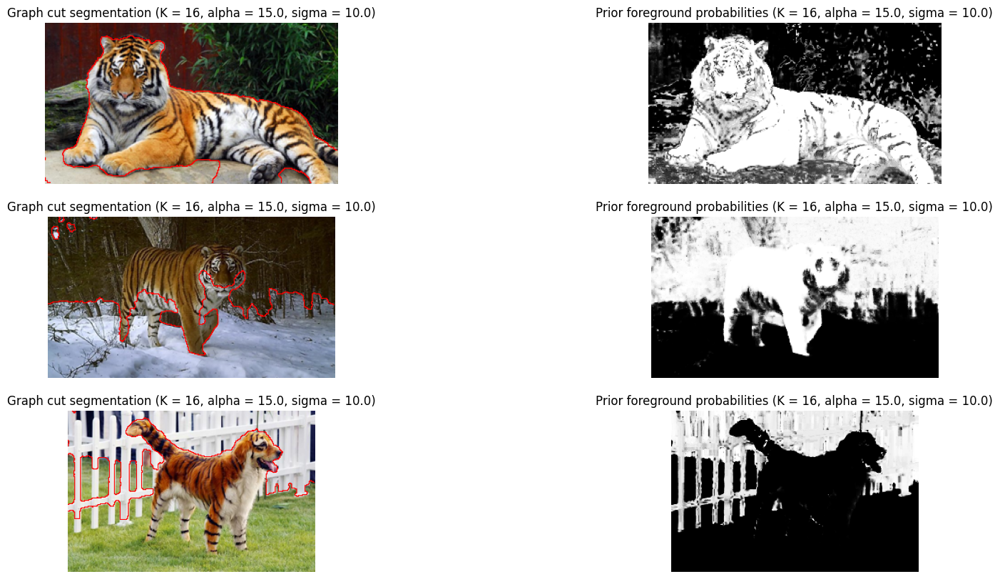

In [101]:
alpha = 15.0
sigma = 10.0
scale_factor = 0.5           
area = [ 80, 110, 570, 300 ] 
K = 16

img_paths = ['Images-jpg/tiger1.jpg', 'Images-jpg/tiger2.jpg', 'Images-jpg/tiger3.jpg']

fig, axs = plt.subplots(len(img_paths), 2, figsize=(20, 10))                   


for i, img_path in enumerate(img_paths): 
    img = Image.open(img_path)
    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))

    area = [ int(i*scale_factor) for i in area ]
    I = np.asarray(img).astype(np.float32)
    segm, prior = graphcut_segm(I, area, K, alpha, sigma)

    Inew = mean_segments(img, segm)
    Inew = overlay_bounds(img, segm)
    img = Image.fromarray(Inew.astype(np.ubyte))
    axs[i,0].imshow(img)
    axs[i,0].axis('off')
    axs[i,0].set_title('Graph cut segmentation (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
    axs[i,1].imshow(prior, cmap='gray')
    axs[i,1].axis('off')
    axs[i,1].set_title('Prior foreground probabilities (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
plt.show()


Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100


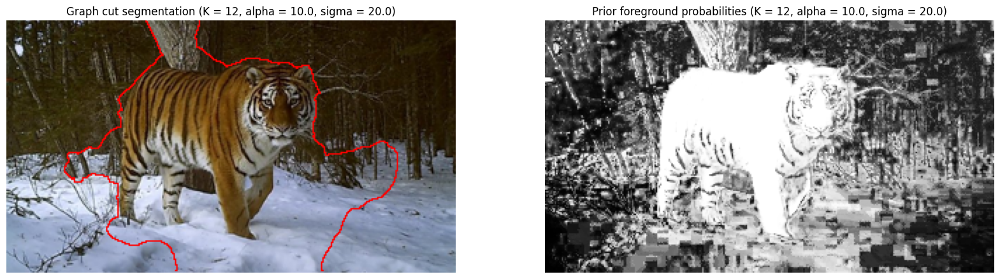

In [130]:
scale_factor = 0.5           
area = [ 80, 110, 570, 300 ] 
K = 12                      
alpha =10.0                  
sigma = 20.0                 

img = Image.open('Images-jpg/tiger2.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))

area = [ int(i*scale_factor) for i in area ]
I = np.asarray(img).astype(np.float32)
segm, prior = graphcut_segm(I, area, K, alpha, sigma)

Inew = mean_segments(img, segm)
Inew = overlay_bounds(img, segm)
img = Image.fromarray(Inew.astype(np.ubyte))

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(img)
axs[0].axis('off')
axs[0].set_title('Graph cut segmentation (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
axs[1].imshow(prior, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Prior foreground probabilities (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
plt.show()

Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 96


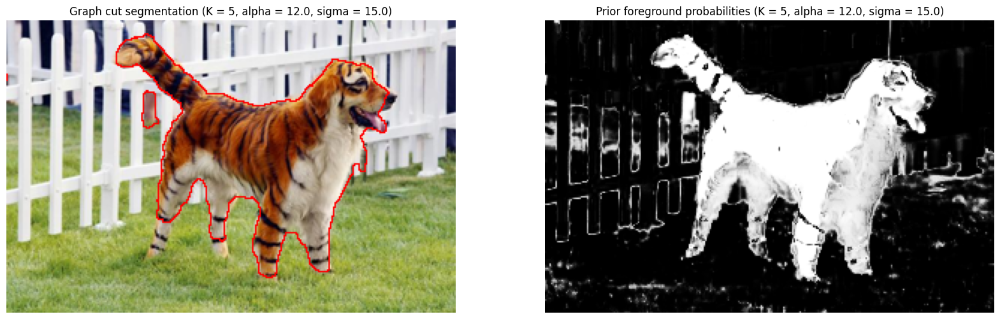

In [113]:
scale_factor = 0.5          
area = [ 80, 110, 570, 300 ] 
K = 5                     
alpha = 12.0                  
sigma = 15.0                 

img = Image.open('Images-jpg/tiger3.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))

area = [ int(i*scale_factor) for i in area ]
I = np.asarray(img).astype(np.float32)
segm, prior = graphcut_segm(I, area, K, alpha, sigma)

Inew = mean_segments(img, segm)
Inew = overlay_bounds(img, segm)
img = Image.fromarray(Inew.astype(np.ubyte))

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(img)
axs[0].axis('off')
axs[0].set_title('Graph cut segmentation (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
axs[1].imshow(prior, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Prior foreground probabilities (K = {}, alpha = {}, sigma = {})'.format(K, alpha, sigma))
plt.show()

### Question 12

Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 95
Find Gaussian mixture models...
Find minimum cut...
number of iterations = 100
Find Gaussian mixture models...
Find minimum cut...
n

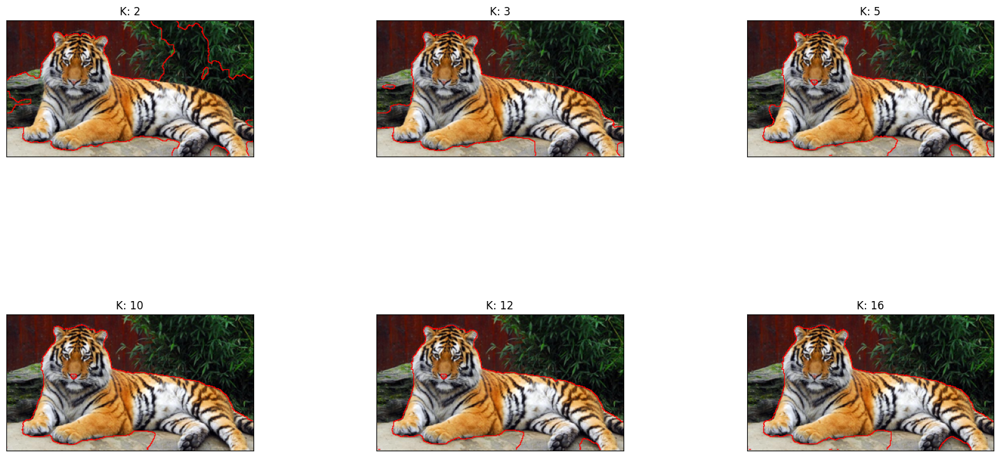

In [69]:
alpha = 10.0
sigma = 15
K_s = [2, 3,5, 10, 12, 16]
scale_factor = 0.5           # image downscale factor
area = [ 80, 110, 570, 300 ] # image region to train foreground with [ minx, miny, maxx, maxy ]

img = Image.open('Images-jpg/tiger1.jpg')
img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))
area = [ int(i*scale_factor) for i in area ]
I = np.asarray(img).astype(np.float32)

num_rows_plot=2

f, ax = plt.subplots(num_rows_plot, int(len(K_s)/num_rows_plot), figsize=(20, 10))
ax = ax.flatten()
f.subplots_adjust(hspace=0.5, wspace=0.5)
for i, K in enumerate(K_s):
    segm, prior = graphcut_segm(I, area, K, alpha, sigma)
    Inew = mean_segments(img, segm)
    Inew = overlay_bounds(img, segm)
    img_to_plot = Image.fromarray(Inew.astype(np.ubyte))
    ax[i].imshow(img_to_plot)
    ax[i].set_title(f"K: {K}")
    ax[i].set_aspect('equal')
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
plt.show()

